# S&P 500| Time Series | LSTM


## import Library


In [1]:
# The auto_arima module from pmdarima package is not directly available on Kaggle so we'll install it using pip.
!pip install pmdarima

In [2]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [3]:
# importing libraries

import os
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

#All necessary plotly libraries
import plotly as plotly
import plotly.io as plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# stats tools
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Arima Model
from pmdarima.arima import auto_arima

# metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math

# LSTM 
from tensorflow import keras
from tensorflow.keras.layers import Dense,LSTM,Dropout,Flatten
from tensorflow.keras import Sequential

## Load the data Set & data Clean


In [4]:
df = pd.read_csv("data/SPX.csv")
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1927-12-30,17.660000,17.660000,17.660000,17.660000,17.660000,0
1,1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0
2,1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0
3,1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0
4,1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0


### meaninng for the feature Teams:

1. Open -> Open means the price at which a stock started trading when the opening bell rang.
2. Close -> Close refers to the price of an individual stock when the stock exchange closed shop for the day. It represents the last buy-sell order executed between two traders
3. High -> The high is the highest price at which a stock is traded during a period.
4. Low -> The low is the lowest price of the period.
5. Adj Close -> Adjusted values factor in corporate actions such as dividends, stock splits, and new share issuance
6. Volume -> Volume is the total number of shares traded in a security period.


In [5]:
# checking when our data ends
df.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
23318,2020-10-29,3277.169922,3341.050049,3259.820068,3310.110107,3310.110107,4903070000
23319,2020-10-30,3293.590088,3304.929932,3233.939941,3269.959961,3269.959961,4840450000
23320,2020-11-02,3296.199951,3330.139893,3279.739990,3310.239990,3310.239990,4310590000
23321,2020-11-03,3336.250000,3389.489990,3336.250000,3369.159912,3369.159912,4220070000
23322,2020-11-04,3406.459961,3486.250000,3405.169922,3443.439941,3443.439941,4783040000


In [6]:
# checking our data types
df.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [7]:
# date time is object format, so we need to convert Date into datetime format
df['Date'] = pd.to_datetime(df['Date'])

In [8]:
df.dtypes

Date         datetime64[ns]
Open                float64
High                float64
Low                 float64
Close               float64
Adj Close           float64
Volume                int64
dtype: object

In [9]:
# setting date as index
df = df.set_index(df['Date']).sort_index()
print(df.shape)
df.sample(5)

(23323, 7)


,Date,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
1959-11-27,1959-11-27,57.700001,57.700001,57.700001,57.700001,57.700001,3030000
2018-04-04,2018-04-04,2584.040039,2649.860107,2573.610107,2644.689941,2644.689941,3350340000
1980-10-17,1980-10-17,132.220001,133.070007,130.220001,131.520004,131.520004,43920000
1943-02-05,1943-02-05,10.510000,10.510000,10.510000,10.510000,10.510000,0
1964-07-09,1964-07-09,83.120003,83.639999,82.739998,83.220001,83.220001,5040000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 23323 entries, 1927-12-30 to 2020-11-04
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       23323 non-null  datetime64[ns]
 1   Open       23323 non-null  float64       
 2   High       23323 non-null  float64       
 3   Low        23323 non-null  float64       
 4   Close      23323 non-null  float64       
 5   Adj Close  23323 non-null  float64       
 6   Volume     23323 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 1.4 MB


<Axes: xlabel='Date'>

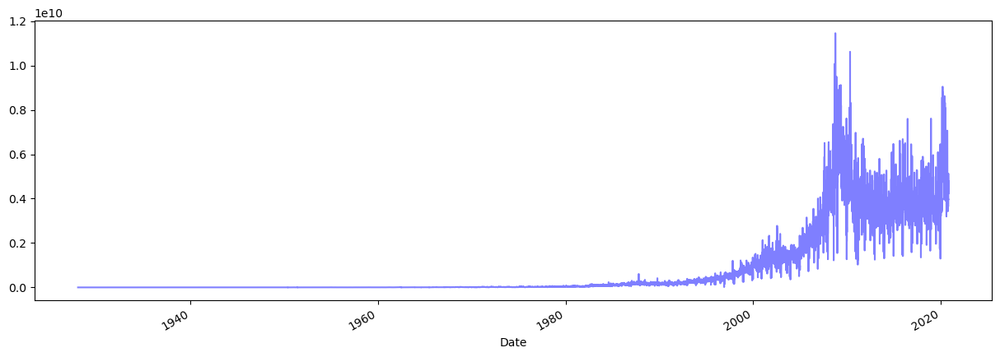

In [11]:
df["Volume"].plot(figsize=(15,5), color='blue', alpha=0.5)

In [12]:
# from the previus graph we can see that the trade is not begin until certain date, so we will drop those data that with the Volume = 0
data = df[df['Volume']>0]
data.head()

,Date,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
1950-01-03,1950-01-03,16.66,16.66,16.66,16.66,16.66,1260000
1950-01-04,1950-01-04,16.85,16.85,16.85,16.85,16.85,1890000
1950-01-05,1950-01-05,16.93,16.93,16.93,16.93,16.93,2550000
1950-01-06,1950-01-06,16.98,16.98,16.98,16.98,16.98,2010000
1950-01-09,1950-01-09,17.08,17.08,17.08,17.08,17.08,2520000


The note auth let the data start at 1987-10-28 but I don't agree with it


In [13]:
data.shape

(17827, 7)

## Data Visualizing the Stock Price Dataset


## part we skiped

right here the original data using the data = data.loc[1987-10-28], the reason is not clear right there, but prob caused by 1950-1987 S&P 500 was near 0, and those could case a huge offset for our model.


<Axes: xlabel='Date'>

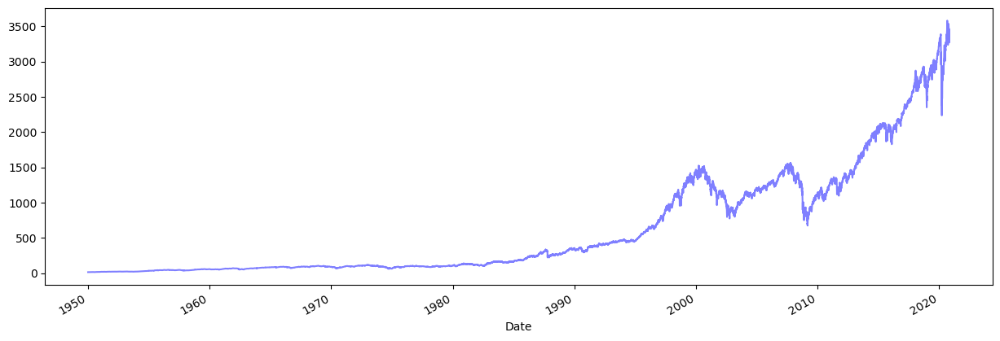

In [14]:
data["Close"].plot(figsize=(15,5), color='blue', alpha=0.5)

<Axes: xlabel='Close', ylabel='Density'>

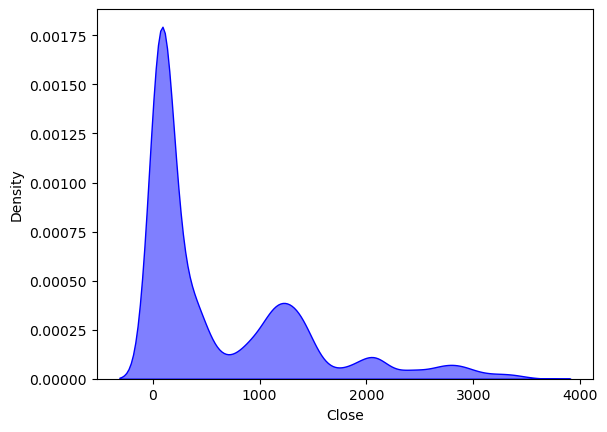

In [15]:
# now we can darw the KDE plot for the Close price
sns.kdeplot(data['Close'], color='blue', alpha=0.5, fill=True)

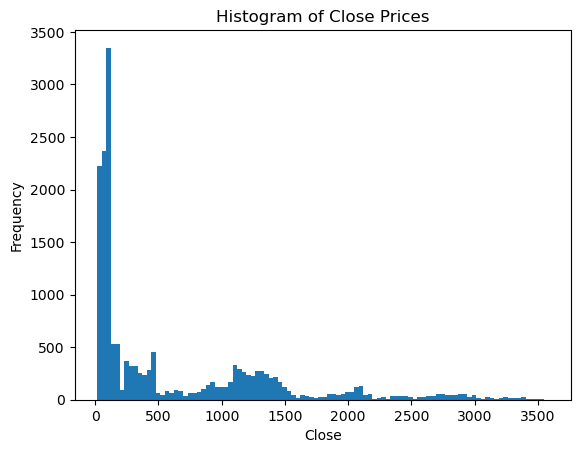

In [16]:
# see from the graph that the Close price by using the histogram plot
plt.hist(data['Close'], bins=100)
plt.xlabel('Close')
plt.ylabel('Frequency')
plt.title('Histogram of Close Prices')
plt.show()


### KDE graph Knowledge:

Kernel Density Estimation (KDE) does not directly draw histograms of real data points, but rather uses a smoothed distribution (e.g., Gaussian kernel) for each data point to estimate the overall distribution, so:
KDE may "pull out some density" around 0 even if there are no actual data points at 0.

This is due to the mathematical properties of the KDE, especially when there are a lot of data points close to 0, e.g. concentrated in the tens to hundreds range, its kernel function "tails" will be extended to 0, which gives you the visual impression that there is a density peak near 0.


# adding feature

return: close - open / open, this tells you how much it grow


In [17]:
# adding return Column
data['Return'] = (data['Adj Close'] - data['Open']) / data['Open'] 

data.sample(5)

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\1243940668.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,Open,High,Low,Close,Adj Close,Volume,Return
Date,,,,,,,,
2018-09-27,2018-09-27,2911.649902,2927.219971,2909.270020,2914.000000,2914.000000,3060850000,0.000807
1953-03-03,1953-03-03,26.000000,26.000000,26.000000,26.000000,26.000000,1850000,0.000000
1963-03-19,1963-03-19,65.610001,65.849998,65.190002,65.470001,65.470001,3180000,-0.002134
1959-05-12,1959-05-12,57.959999,57.959999,57.959999,57.959999,57.959999,3550000,0.000000
2010-09-16,2010-09-16,1123.890015,1125.439941,1118.880005,1124.660034,1124.660034,3364080000,0.000685


In [18]:
#making a copy for later use
stock_data = data.copy()

In [19]:
# when we do stock analysis, we should use the closing price as the tandard measure of the stock's  value

fig = px.line(data,x="Date",y="Close",title="Closing Price: Range Slider and Selectors")
fig.update_xaxes(rangeslider_visible=True,rangeselector=dict(
    buttons=list([
        dict(count=1,label="1m",step="month",stepmode="backward"),
        dict(count=6,label="6m",step="month",stepmode="backward"),
        dict(count=1,label="YTD",step="year",stepmode="todate"),
        dict(count=1,label="1y",step="year",stepmode="backward"),
        dict(step="all")
])))

In [20]:
# Visualizing Returns

fig = px.line(data,x="Date",y="Return",title="Returns : Range Slider and Selectors")
fig.update_xaxes(rangeslider_visible=True,rangeselector=dict(
    buttons=list([
        dict(count=1,label="1m",step="month",stepmode="backward"),
        dict(count=6,label="6m",step="month",stepmode="backward"),
        dict(count=1,label="YTD",step="year",stepmode="todate"),
        dict(count=1,label="1y",step="year",stepmode="backward"),
        dict(step="all")
])))

## part we skip

from this graph we could also see that the return for this stock has huge inflation happened at 1987-10-11 - 1987-10-25. The return rate was up and down over 0.3. This is a strong offset


# Candlestick Plots

red candlestick: closing price < opening price (drop)

green candle : closing price > opening price (grow)


In [21]:
fig = go.Figure(data=[go.Candlestick(x=data['Date'],
                                    open=data['Open'],
                high=data['High'],
                low=data['Low'],
                close=data['Close'])])
fig.show()

# Resampling

in time series, data consistency is important.

there is 2 way of Resampling

1. Upsampling: from low frequency to high frequency (Monthly to Daily). it involves filling or interpolating missing data (or you can say it's "FAKING")
2. Downsampling: Time series is resampled from high frequency to low frequency (Weekly to monthly frequency). it invovlves aggregation of existing data.

for this dataset, we gonna use downsampling, we will do from month to year


In [22]:
# A represents "year end frequecy" max is the aggregator function
data.resample(rule = "A").max().tail(5)

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\235641409.py:2: FutureWarning:

'A' is deprecated and will be removed in a future version, please use 'YE' instead.



,Date,Open,High,Low,Close,Adj Close,Volume,Return
Date,,,,,,,,
2016-12-31,2016-12-30,2270.540039,2277.530029,2266.149902,2271.719971,2271.719971,7597450000,0.024414
2017-12-31,2017-12-29,2692.709961,2694.969971,2685.919922,2690.159912,2690.159912,5723920000,0.008097
2018-12-31,2018-12-31,2936.760010,2940.909912,2927.110107,2930.750000,2930.750000,7609010000,0.044255
2019-12-31,2019-12-31,3247.229980,3247.929932,3234.370117,3240.020020,3240.020020,6454270000,0.023283
2020-12-31,2020-11-04,3564.739990,3588.110107,3535.229980,3580.840088,3580.840088,9044690000,0.054876


C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\3176771357.py:3: FutureWarning:

'A' is deprecated and will be removed in a future version, please use 'YE' instead.



<Axes: xlabel='Date'>

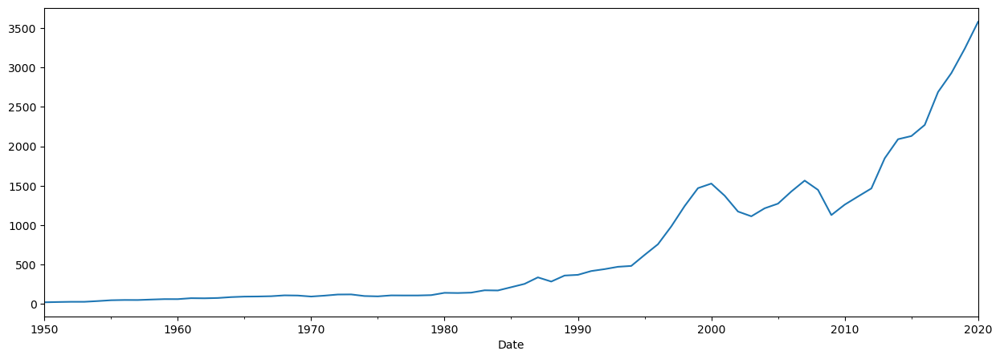

In [23]:
# Let's suppose if we want to visualize the max Close values of all years

data['Close'].resample(rule='A').max().plot(figsize=(15,5))

# Technical Indicators

Here are some the most beneficial in automated trading.

1. **Simple Moving Average(Fast and Slow)**:shows the average price over a specific time period to identify trend direction.
2. **Exponential Moving Average(Fast and Slow)**: gives more weight to recent prices, making it more responsive to short-term changes.
3. **Relative Strength Index (RSI)**: measures the speed and change of price movements to detect overbought or oversold conditions.
4. **Moving Average Convergence Divergence (MACD)** tracks trend strength and potential reversals using the difference between two EMAs.


## Simple Moving Average

the formula for this is just adding all number (in that range) and divide with the day you set up(find the mean)


In [24]:
# SMA(SMA_15) is the 15 days moving average of the Close price
data['SMA_15'] = data['Close'].rolling(15).mean().shift()

# SMA(SMA_5) is the 5 days moving average of the Close price
data['SMA_5'] = data['Close'].rolling(5).mean().shift()

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.Date,y=data.SMA_5,name='SMA_5'))
fig.add_trace(go.Scatter(x=data.Date,y=data.SMA_15,name='SMA_15'))
fig.add_trace(go.Scatter(x=data.Date,y=data.Close,name='Close', opacity=0.3))
fig.show()

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\2123012729.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\2123012729.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### what does the SMA tell us?

**Golden Cross**： this is represent for when the SMA_5(fast) go hight and the SMA_15(slow) when down and have a cross. This is a strong sign for buy in.

**Death Cross**: This is represent for when the SMA_5(fast) go low and the SMA_15(slow) when hight and have a cross. This is a strong sign for sell out.


## Exponential Moving Average (EMA)

this is a indicator for Recent price changes

formula is like this:

    EMA_t = α * P_t + (1 - α) * EMA_{t-1}

    α = 2 / (N + 1)

(N is the # of priod you set up e.g. 3 days or 7days etc)

this formula is like the Convex Combination formula in ML, which indicate how much you should trust the A and B

for EMA:

the larger the N, the less you count on todays value, since larger N cause smaller α, and smaller α cause larger presentage for EMA_t-1


In [25]:
data['EMA_5'] = data['Close'].ewm(5).mean().shift()
data['EMA_15'] = data['Close'].ewm(15).mean().shift()

# If u want to visualize between a range of specific dates u can do it like -> fig = go.Figure(layout_xaxis_range=['2019-06-04','2020-01-02'])

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.Date,y=data.EMA_5,name='EMA_5'))
fig.add_trace(go.Scatter(x=data.Date,y=data.EMA_15,name='EMA_15'))
fig.add_trace(go.Scatter(x=data.Date,y=data.Close,name='Close', opacity=0.3))
fig.show()

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\1322821367.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\1322821367.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# what dose this graph tells us?

When EMA_5 crosses above EMA_15, it suggests that short-term price momentum is rising faster than the long-term trend, potentially indicating the start of an uptrend.


In [26]:
# Now lets compare SMA's and EMA's

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.Date,y=data.SMA_5,name='SMA_5'))
fig.add_trace(go.Scatter(x=data.Date,y=data.EMA_5,name='EMA_5'))
fig.add_trace(go.Scatter(x=data.Date,y=data.Close,name='Close', opacity=0.3))
fig.show()
# EMA_5 is performing better than SMA_5 as it is closer to CLosing price of Stock.

Plotting both EMA_5 and SMA_5 helps compare sensitivity and stability in short-term trend analysis: EMA reacts faster, while SMA smooths out noise.


## Relative Strength Index (RSI)

The RSI is calculated as:

$$
\text{RSI} = 100 - \frac{100}{1 + RS}
$$

Where:

- $RS = \frac{\text{Average Gain over } N \text{ periods}}{\text{Average Loss over } N \text{ periods}}$
- Commonly, $N = 14$ (14-day RSI)

This is a indication of the strength of recent gains and losses to determine whether the market is overbought (too expensive) or oversold (too cheap)

if the avg gain hight, and avg loss is low, it will provide a big number, which represent for the market is little bit over too hot


In [27]:
def RSI(df,n=14):
    close = df['Close']
    delta = close.diff()
    delta = delta[1:]
    pricesUp = delta.copy()
    pricesDown = delta.copy()
    pricesUp[pricesUp<0]=0
    pricesDown[pricesDown>0]=0
    rollUp = pricesUp.rolling(n).mean()
    rollDown = pricesDown.abs().rolling(n).mean()
    rs = rollUp/rollDown
    rsi = 100.0 - (100.0 / (1.0 + rs))
    return rsi

data['RSI'] = RSI(df).fillna(0)

fig = go.Figure(go.Scatter(x=data.Date,y=data.RSI,name='RSI'))
fig.show()

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\3317220758.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### what dose RSI tells us?

The long-term RSI chart shows frequent oscillations between overbought and oversold zones, indicating a highly volatile market with repeated short-term sentiment shifts, but no sustained bullish or bearish momentum.


## Moving Average Convergence Divergence (MACD)

### 📐 MACD Formula

MACD consists of:

1. **MACD Line**:

   $$
   \text{MACD} = \text{EMA}_{\text{short}} - \text{EMA}_{\text{long}}
   $$

   Usually: short = 12-day, long = 26-day

2. **Signal Line**:

   $$
   \text{Signal} = \text{EMA}_9(\text{MACD})
   $$

3. **MACD Histogram**:
   $$
   \text{Histogram} = \text{MACD} - \text{Signal}
   $$


In [28]:
data['EMA_12'] = pd.Series(data['Close'].ewm(span=12).mean())
data['EMA_26'] = pd.Series(data['Close'].ewm(span=26).mean())
data['MACD'] = pd.Series(data['EMA_12'] - data['EMA_26'])
data['MACD_signal'] = pd.Series(data.MACD.ewm(span=9,min_periods=9).mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.Date,y=data.MACD,name='MACD'))
fig.add_trace(go.Scatter(x=data.Date,y=data.MACD_signal,name='MACD_signal'))
fig.show()

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\1460396189.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\1460396189.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\1460396189.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

### what dose MACD tells us?

This MACD chart shows a strong bullish reversal in April 2020 as the MACD line crosses above the signal line, followed by multiple crossovers indicating short-term trend shifts.


# Time series Decomposition

Time series ---------> trend | seasonal | remainder

The series can be decomposed as an additive(+) or multiplicative(\*) combination of the base level, trend, seasonal index & residual


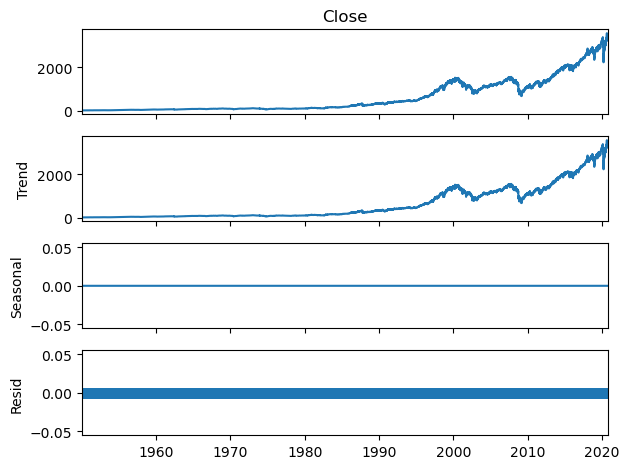

In [29]:
series =  data.Close
result = seasonal_decompose(series, model='additive', period=1) # The frequncy is daily data
figure = result.plot()

## what's the seasonal_decompose() function?

The seasonal_decompose() is a function from statsmodles

this function will decompose the input timeseries number into

1. observed (original data)
2. trend
3. Seasonal
4. resid

but period as 1 usually is not good, which mean we expect no repeat in seasonal data and stuff.
we can do 7 or 365.


## what's the different between additive modle and multiplicative model?

### ➕ Additive Model

The additive model assumes that the components of the time series combine linearly:

$$
Y_t = T_t + S_t + R_t
$$

Where:

- \( Y_t \): Observed value at time \( t \)
- \( T_t \): Trend component
- \( S_t \): Seasonal component
- \( R_t \): Residual (random noise)

**When to use:**

- The magnitude of seasonal variations does **not change** with the trend.
- Suitable for series with **constant amplitude** seasonality.

---

#### ✖️ Multiplicative Model

The multiplicative model assumes that the components interact non-linearly:

$$
Y_t = T_t \times S_t \times R_t
$$

Or, equivalently (after taking logs):

$$
\log(Y_t) = \log(T_t) + \log(S_t) + \log(R_t)
$$

Where:

- \( Y_t \): Observed value
- \( T_t \): Trend component
- \( S_t \): Seasonal component
- \( R_t \): Residual (random noise)

**When to use:**

- The magnitude of seasonal variations **increases or decreases** with the trend.
- Suitable for series with **changing amplitude** seasonality.


## 📊 How Can I Know If My Stock Has Constant or Changing Amplitude?

To determine whether your stock exhibits **constant amplitude** (additive behavior) or **changing amplitude** (multiplicative behavior), follow these steps:

---

### 1. 📈 Plot the Raw Price vs Time

- If the price increases at a **steady pace** (e.g., ~$50/year), it may be **additive**.
- If the curve gets **steeper over time**, it's likely **multiplicative (exponential growth)**.

---

### 2. 🔍 Plot the Log of the Price

Take the logarithm of the price series and plot it:

- If the log-transformed series becomes a **straight line**, the original series grows **exponentially** → use **multiplicative model**.
- If still nonlinear, further analysis is needed.

---

### 3. 📉 Decompose the Time Series

Use `seasonal_decompose` to visually inspect the **seasonal component**:

- If the **seasonal spikes stay the same** over time → **constant amplitude** → additive model
- If the **seasonal spikes grow/shrink** → **changing amplitude** → multiplicative model

### 4. 📊 Check Annual Growth Rate (Optional)

Convert to yearly frequency and calculate percent change:

- Stable dollar gain → additive
- Stable percent gain → multiplicative

---


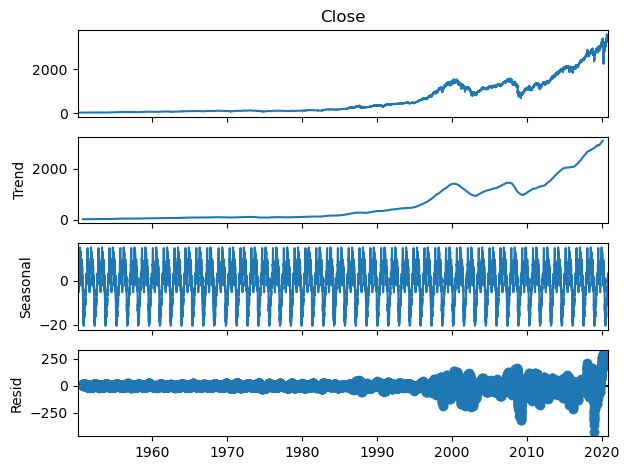

In [30]:
series = data.Close
result = seasonal_decompose(series, model='additive',period=365) # The frequncy is yearly
figure = result.plot()

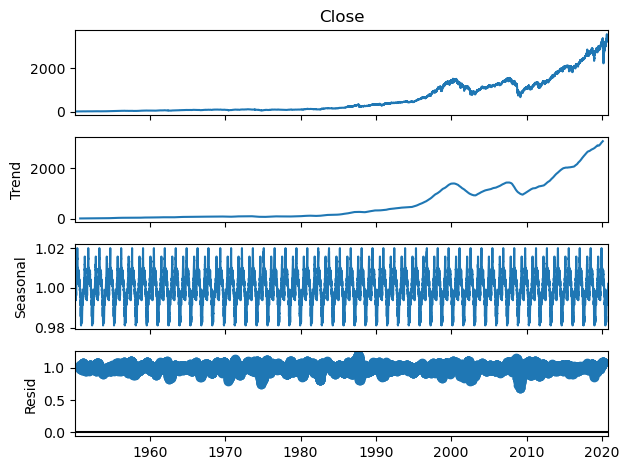

In [31]:
series = data.Close
result = seasonal_decompose(series, model='multiplicative',period=365) # The frequncy is yearly
figure = result.plot()

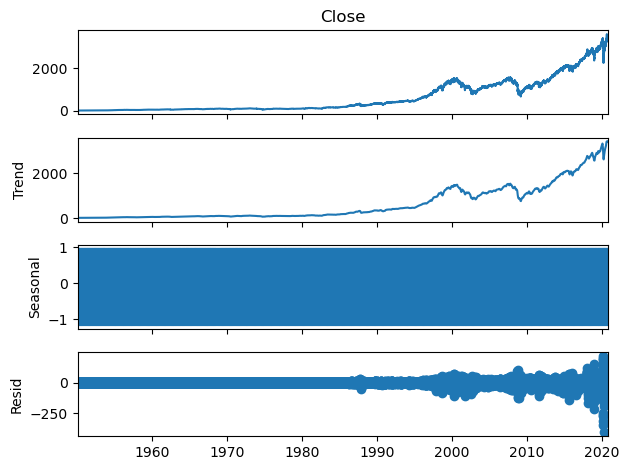

In [32]:
series = data.Close
result = seasonal_decompose(series, model='additive',period=30) # The frequncy is monthly
figure = result.plot()

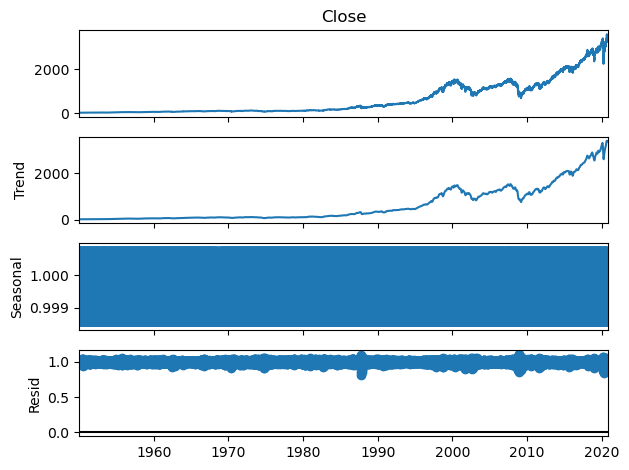

In [33]:
series = data.Close
result = seasonal_decompose(series, model='multiplicative',period=30) # The frequncy is monthly
figure = result.plot()

### 🔁 Interpretation Summary

#### ❓ Why use `multiplicative` model?

Because the stock price increases over time and its **volatility (amplitude of fluctuation) grows proportionally**, which is a typical sign of **exponential growth**.  
A multiplicative model preserves the **relative stability of seasonal and residual components** by scaling them according to the trend level.

---

#### 📅 Why set `period=365`?

Many financial market patterns follow **annual cycles**, such as:

- End-of-year rallies
- First-quarter corrections
- Earnings season effects

Using `period=365` captures these yearly seasonal effects more accurately, which is **especially important for long-term indices like the S&P 500**.

---

✅ **Conclusion:**  
Use `model='multiplicative'` and `period=365` when decomposing long-term stock indices like the S&P 500 for meaningful seasonal analysis.


# Stationary Test/ ADF(Augmented Dickey-Fuller) Test

## 📊 Why Do We Need a Stationarity Test?

In time series analysis, testing for stationarity is a critical first step before building any forecasting model such as ARIMA, Granger causality, or cointegration models. Here's why:

---

### 🔁 What is Stationarity?

A time series is **stationary** if its statistical properties — mean, variance, and autocorrelation — remain **constant over time**.

There are two main types:
- **Strong stationarity**: The entire joint distribution is invariant over time.
- **Weak stationarity**: The mean, variance, and autocorrelation structure are time-invariant.

---

### ❗ Why Stationarity Matters

- Many time series models assume that the data is stationary.
- **Non-stationary series** often exhibit trends or time-dependent variance, which can lead to:
  - Spurious correlations
  - Unreliable parameter estimates
  - Poor forecasting accuracy
- Stationary data ensures more stable and consistent model behavior.

---

### 🧪 What Is a Stationarity Test?

The **Augmented Dickey-Fuller (ADF) Test** is commonly used to test for a unit root in the series.

- **Null Hypothesis (H₀):** The series has a unit root → **non-stationary**
- **Alternative Hypothesis (H₁):** The series has no unit root → **stationary**

If the **p-value < 0.05**, we reject the null hypothesis and conclude that the series is stationary.

---

### 🔄 What If the Series Is Not Stationary?

You can transform a non-stationary series into a stationary one using:
- **Differencing** (e.g., `.diff()`)
- **Log transformation**
- **Detrending** or **seasonal adjustment**

---

### ✅ Summary

Testing for stationarity ensures that your time series model is built on stable, reliable statistical assumptions — leading to **more accurate predictions and valid interpretations**.

### 📊 Stationarity Check Workflow Summary

| Step | Purpose                    | Method / Tool                      | Interpretation                     |
|------|-----------------------------|------------------------------------|-------------------------------------|
| 1️⃣   | Visual inspection          | `plt.plot()`                        | Obvious trend or changing volatility → likely non-stationary |
| 2️⃣   | Rolling stats check       | `.rolling().mean()` / `.std()`     | Lines flat → possibly stationary; lines drifting → non-stationary |
| 3️⃣   | Statistical test (ADF)    | `adfuller(series)`                 | p-value < 0.05 → stationary; > 0.05 → non-stationary |
| 4️⃣   | First differencing        | `series.diff().dropna()`           | Remove trend; re-run steps 2 and 3 |
| 5️⃣   | Confirm stationarity      | Repeat rolling + ADF               | If passes → ready for modeling (e.g., ARIMA) |


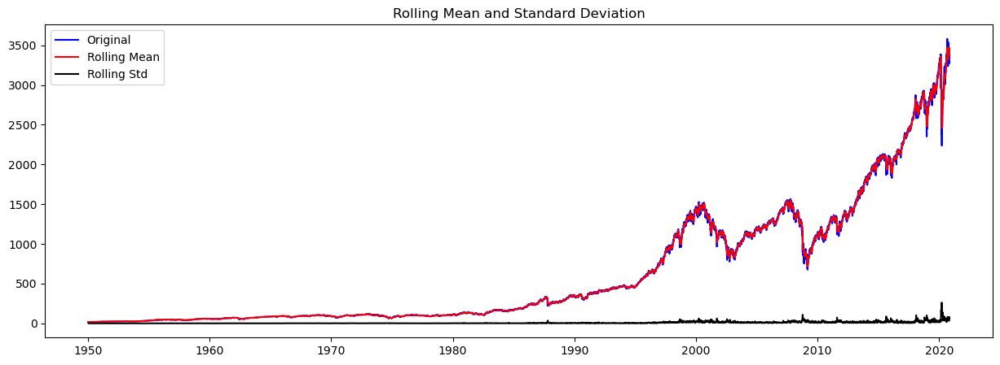

Results of dickey fuller test
Test Statistics                    3.236923
p-value                            1.000000
No. of lags used                  44.000000
Number of observations used    17782.000000
dtype: float64


In [34]:
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(12).mean()
    rolstd = timeseries.rolling(12).std()
    
    #Plot rolling statistics:
    plt.figure(figsize=(15,5))
    plt.plot(timeseries,color='blue',label='Original')
    plt.plot(rolmean,color='red',label='Rolling Mean')
    plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    
    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    #hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    print(output)

test_stationarity(data['Close'])    

### 📊 ADF Test: Hypotheses Summary

In the **Augmented Dickey-Fuller (ADF) Test**, we are testing whether a time series is **stationary** or not.

---

#### 🧪 Null Hypothesis (\( H_0 \)):

- The time series **has a unit root**
- It is **non-stationary**
- There is a **trend or time-dependent structure**
- Example: Random walk or trending data

---

#### ✅ Alternative Hypothesis (\( H_1 \)):

- The time series **does not have a unit root**
- It is **stationary**
- Mean and variance are constant over time

---

#### 🔍 Decision Rule:

- If **p-value < 0.05** → Reject \( H_0 \) → ✅ The series is **stationary**
- If **p-value ≥ 0.05** → Fail to reject \( H_0 \) → ⛔ The series is **non-stationary**

---


Since the increasing mean and standard deviation, our series is not stationary

In [36]:
# remove trend
data['Stocks First Difference'] = data['Close'] - data['Close'].shift(1)

adft = adfuller(data['Stocks First Difference'].dropna(),autolag='AIC')
output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
print(output)

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\4262719191.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Test Statistics                  -21.194815
p-value                            0.000000
No. of lags used                  44.000000
Number of observations used    17781.000000
dtype: float64


In [37]:
# remove seasonal
data['Stock Seasonal Difference'] = data['Close'] - data['Close'].shift(365)
adft = adfuller(data['Stock Seasonal Difference'].dropna(),autolag='AIC')
output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
print(output)


C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\392268219.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Test Statistics                   -3.765323
p-value                            0.003283
No. of lags used                  44.000000
Number of observations used    17417.000000
dtype: float64


In [39]:
data['Stocks Seasonal+Daily Difference']=data['Stock Seasonal Difference']-data['Stock Seasonal Difference'].shift(1)
adft = adfuller(data['Stocks Seasonal+Daily Difference'].dropna(),autolag='AIC')
output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
print(output)

C:\Users\zhuch\AppData\Local\Temp\ipykernel_38420\155647387.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Test Statistics                  -21.401108
p-value                            0.000000
No. of lags used                  44.000000
Number of observations used    17416.000000
dtype: float64


<Axes: xlabel='Date'>

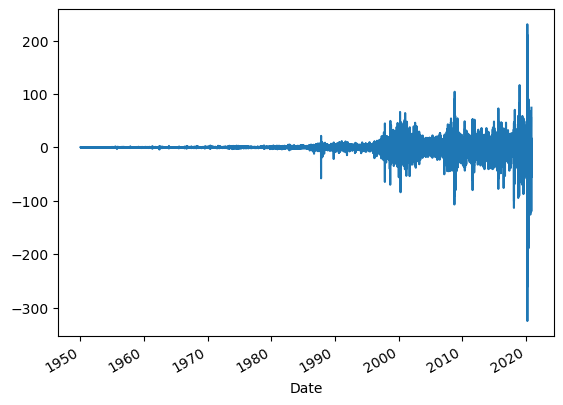

In [40]:
data['Stocks First Difference'].plot()

# ARIMA Model